### PGBM-001

flair shape: (25, 240, 240)
t1 shape: (25, 240, 240)
t1ce shape: (25, 240, 240)
t2 shape: (25, 240, 240)
mask shape: (25, 240, 240)


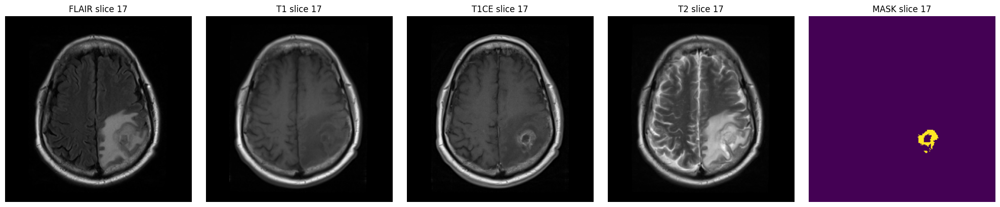

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


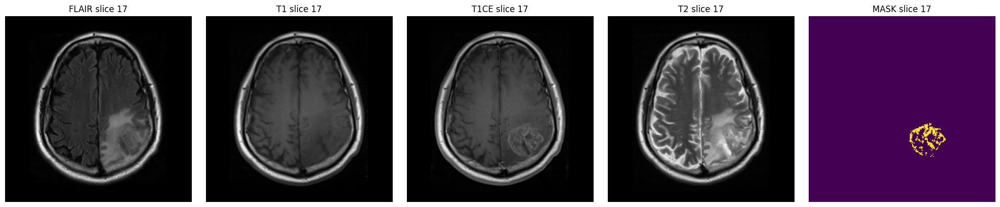

In [2]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-001"
show_btp_case(preproc_root, case_id,
              date_folder="1991-11-19")

show_btp_case(preproc_root, case_id,
              date_folder="1992-04-02")

### PGBM-002

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


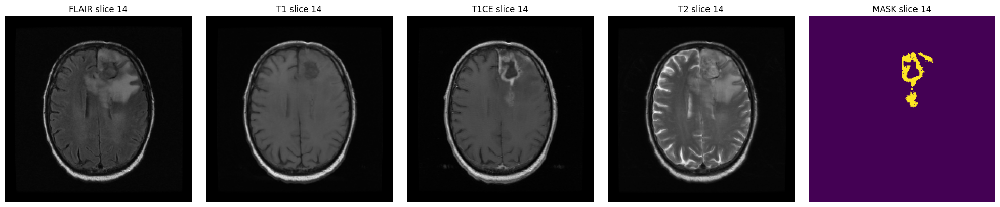

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


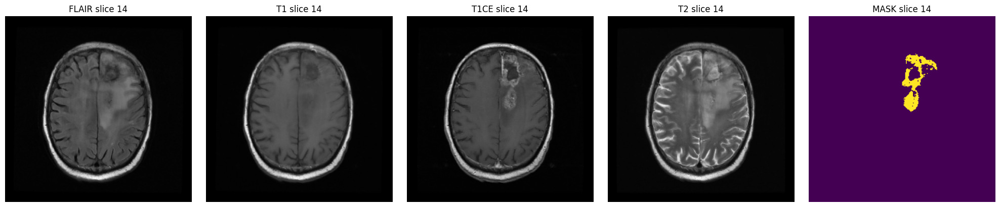

In [3]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-002"
show_btp_case(preproc_root, case_id,
              date_folder="1996-08-13")

show_btp_case(preproc_root, case_id,
              date_folder="1997-01-17")

### PGBM-003

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


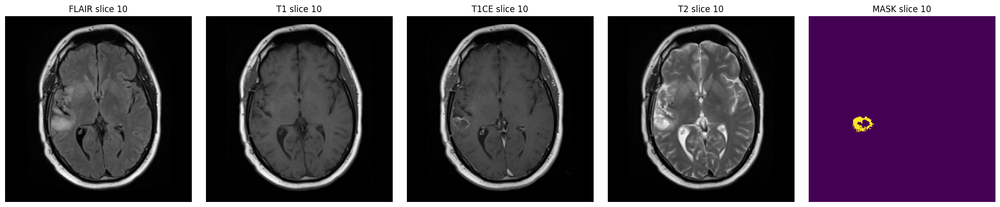

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


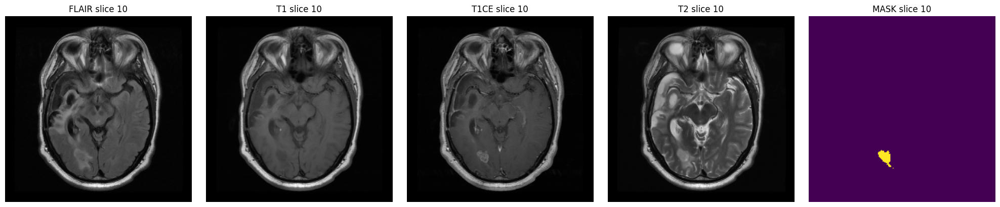

In [4]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-003"
show_btp_case(preproc_root, case_id,
              date_folder="1995-03-29")

show_btp_case(preproc_root, case_id,
              date_folder="1995-10-17")

### PGBM-004

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


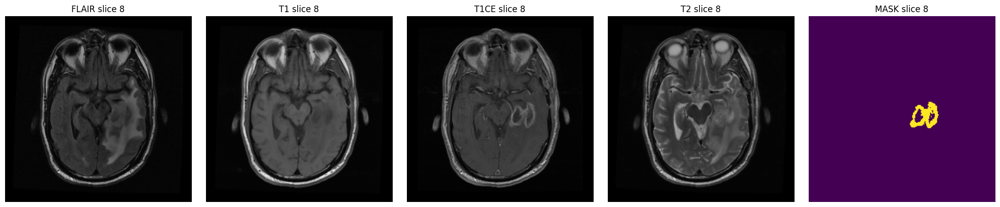

flair shape: (23, 240, 240)
t1 shape: (23, 240, 240)
t1ce shape: (23, 240, 240)
t2 shape: (23, 240, 240)
mask shape: (23, 240, 240)


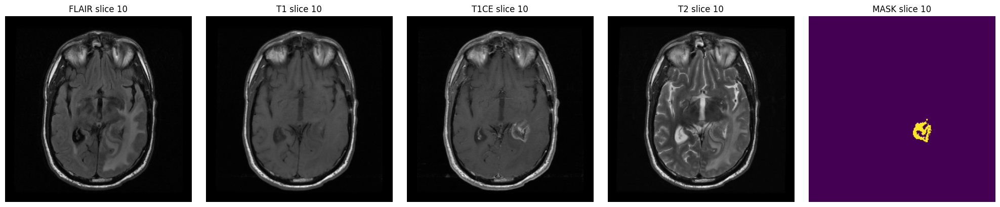

In [5]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-004"
show_btp_case(preproc_root, case_id,
              date_folder="1993-06-22")

show_btp_case(preproc_root, case_id,
              date_folder="1994-01-12")

### PGBM-005

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


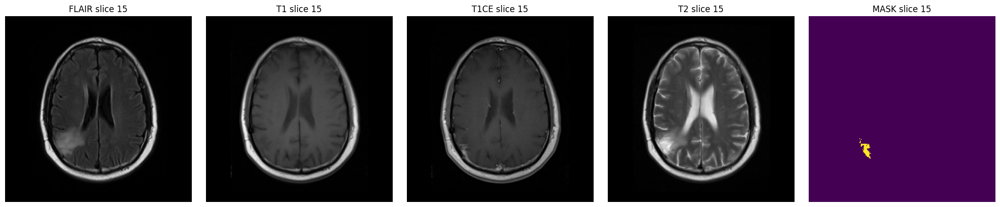

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


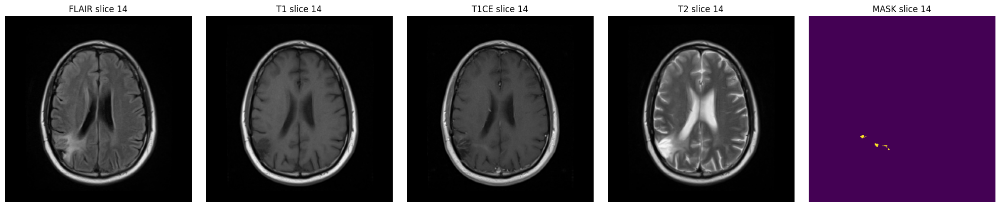

In [6]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-005"
show_btp_case(preproc_root, case_id,
              date_folder="1991-07-02")

show_btp_case(preproc_root, case_id,
              date_folder="1992-05-05")

### PGBM-006

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


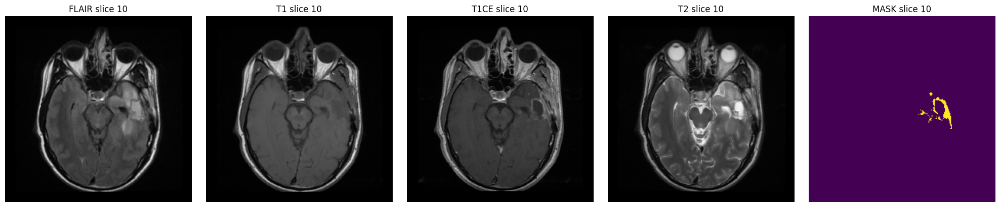

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


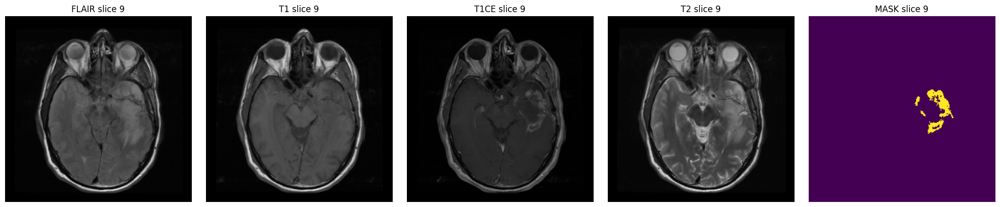

In [7]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-006"
show_btp_case(preproc_root, case_id,
              date_folder="1996-12-10")

show_btp_case(preproc_root, case_id,
              date_folder="1997-02-11")

### PGBM-007

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


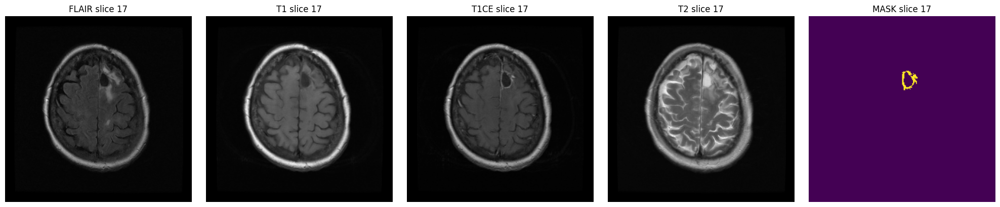

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


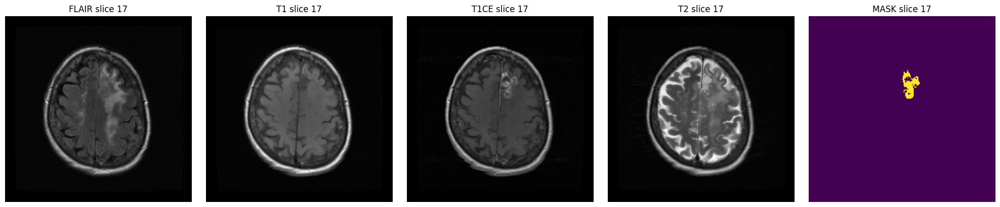

In [9]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-007"
show_btp_case(preproc_root, case_id,
              date_folder="1992-12-29")

show_btp_case(preproc_root, case_id,
              date_folder="1994-02-17")

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


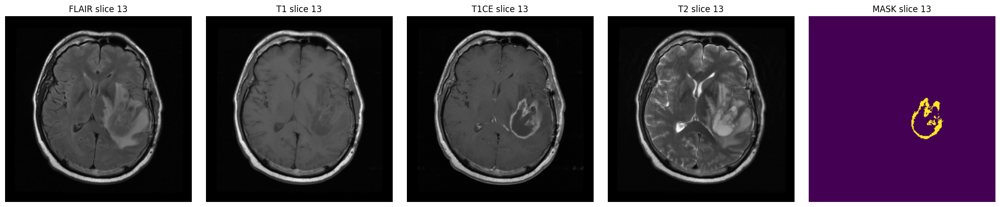

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


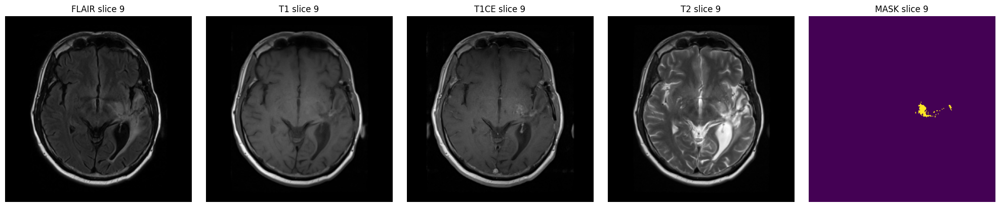

In [10]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-008"
show_btp_case(preproc_root, case_id,
              date_folder="1992-03-31")

show_btp_case(preproc_root, case_id,
              date_folder="1993-06-10")

### PGBM-009

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


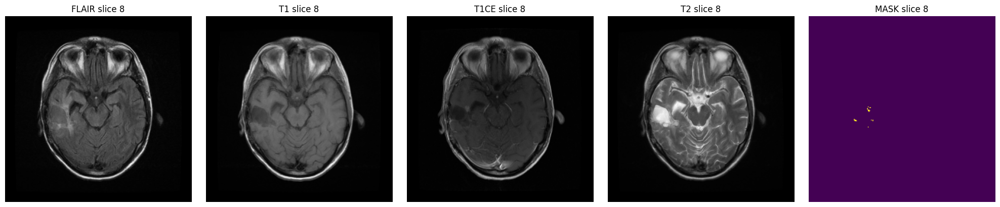

flair shape: (25, 240, 240)
t1 shape: (25, 240, 240)
t1ce shape: (25, 240, 240)
t2 shape: (25, 240, 240)
mask shape: (25, 240, 240)


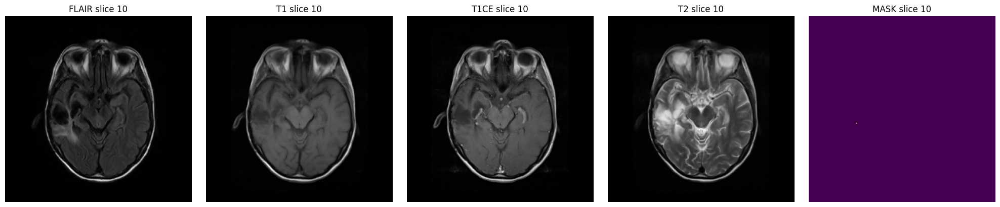

In [11]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-009"
show_btp_case(preproc_root, case_id,
              date_folder="1988-05-12")

show_btp_case(preproc_root, case_id,
              date_folder="1991-01-03")

### PGBM-010

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


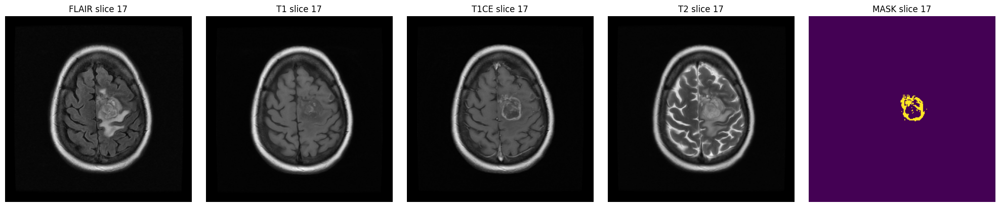

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


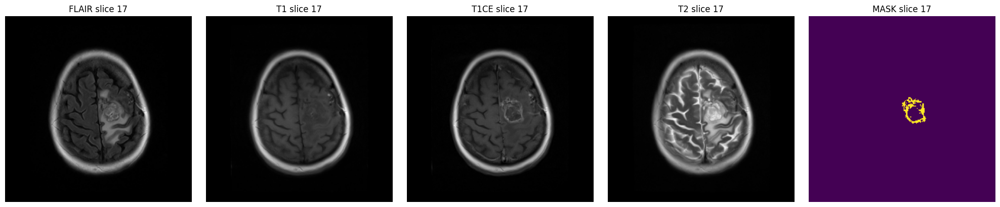

In [12]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-010"
show_btp_case(preproc_root, case_id,
              date_folder="1992-05-20")

show_btp_case(preproc_root, case_id,
              date_folder="1992-06-18")

### PGBM-011

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


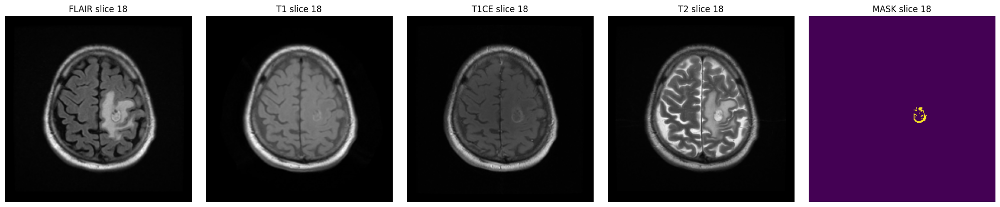

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


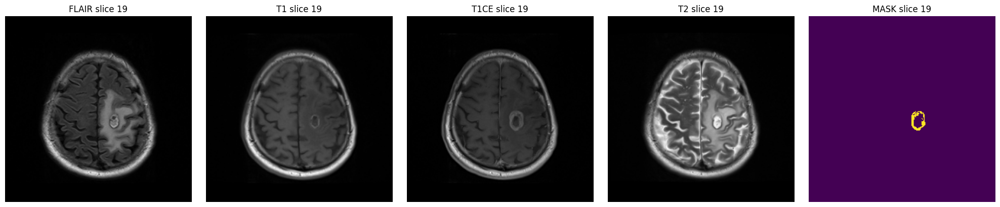

In [13]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-011"
show_btp_case(preproc_root, case_id,
              date_folder="1989-06-29")

show_btp_case(preproc_root, case_id,
              date_folder="1989-08-24")

### PGBM-012

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


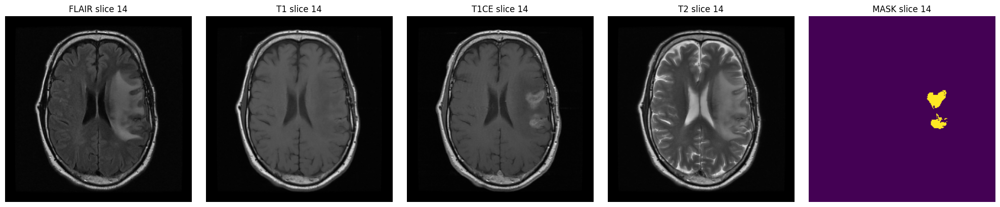

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


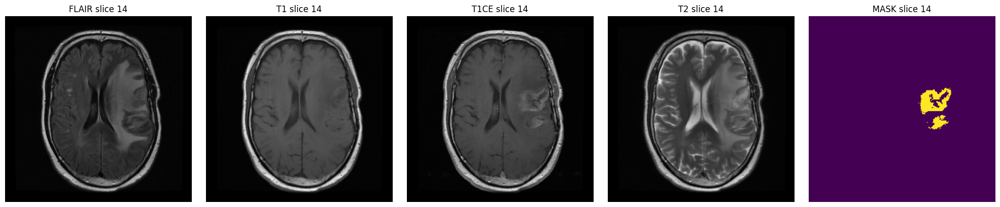

In [14]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-012"
show_btp_case(preproc_root, case_id,
              date_folder="1993-05-26")

show_btp_case(preproc_root, case_id,
              date_folder="1993-07-20")

### PGBM-013

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


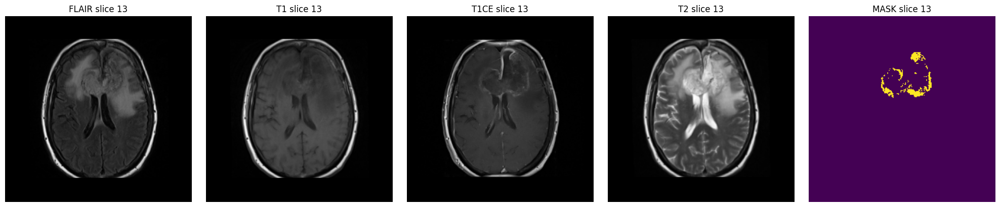

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


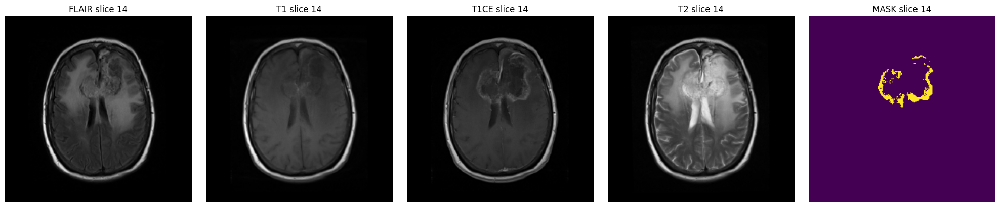

In [15]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-013"
show_btp_case(preproc_root, case_id,
              date_folder="1989-09-18")

show_btp_case(preproc_root, case_id,
              date_folder="1989-11-14")

### PGBM-014

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


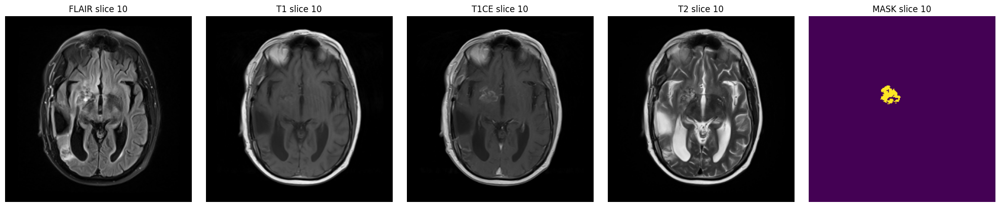

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


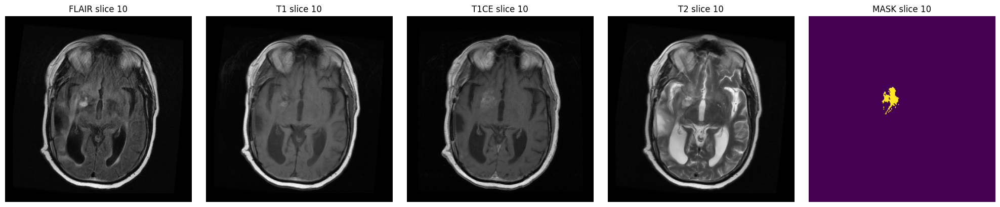

In [16]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-014"
show_btp_case(preproc_root, case_id,
              date_folder="1997-02-03")

show_btp_case(preproc_root, case_id,
              date_folder="1997-04-02")

### PGBM-015

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


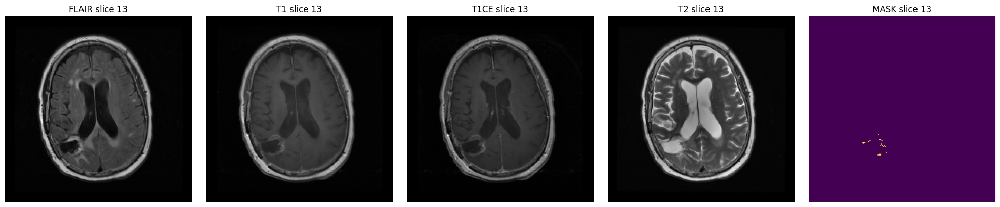

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


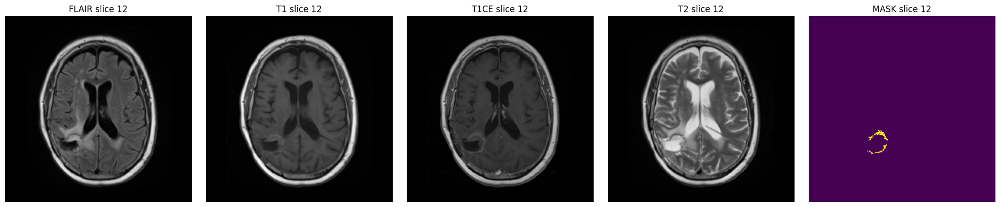

In [17]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-015"
show_btp_case(preproc_root, case_id,
              date_folder="1992-02-27")

show_btp_case(preproc_root, case_id,
              date_folder="1992-05-12")

### PGBM-016

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


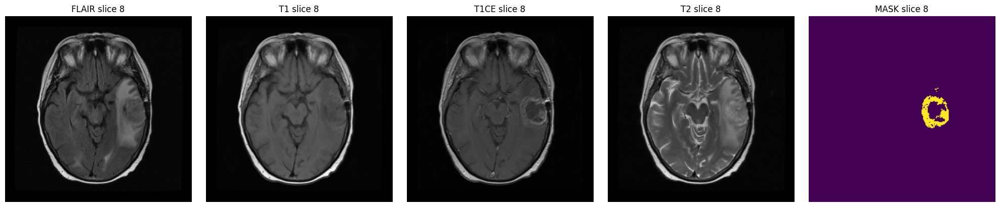

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


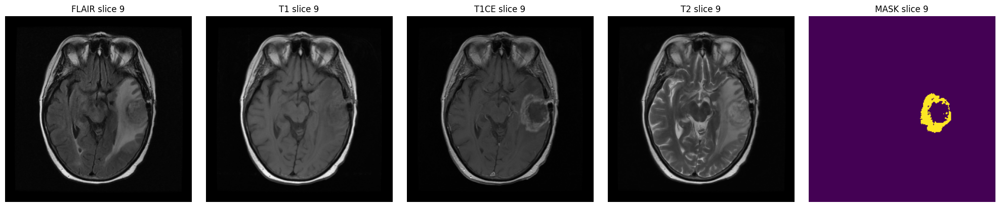

In [18]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-016"
show_btp_case(preproc_root, case_id,
              date_folder="1991-08-20")

show_btp_case(preproc_root, case_id,
              date_folder="1991-10-17")

### PGBM-017

flair shape: (23, 240, 240)
t1 shape: (23, 240, 240)
t1ce shape: (23, 240, 240)
t2 shape: (23, 240, 240)
mask shape: (23, 240, 240)


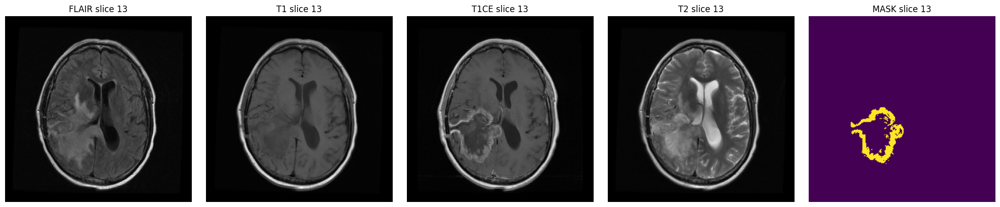

flair shape: (23, 240, 240)
t1 shape: (23, 240, 240)
t1ce shape: (23, 240, 240)
t2 shape: (23, 240, 240)
mask shape: (23, 240, 240)


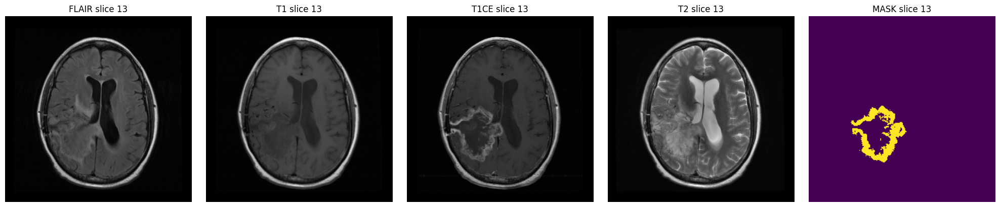

In [19]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-017"
show_btp_case(preproc_root, case_id,
              date_folder="1997-08-21")

show_btp_case(preproc_root, case_id,
              date_folder="1997-09-17")

### PGBM-018

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


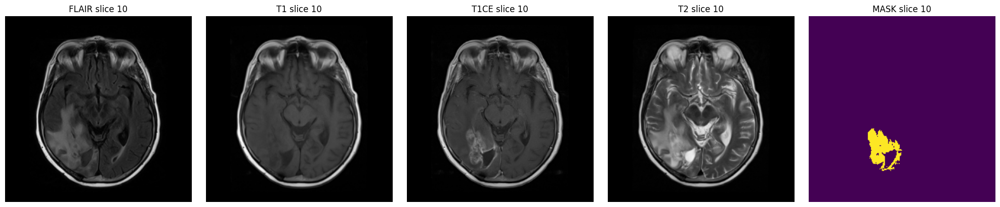

flair shape: (21, 240, 240)
t1 shape: (21, 240, 240)
t1ce shape: (21, 240, 240)
t2 shape: (21, 240, 240)
mask shape: (21, 240, 240)


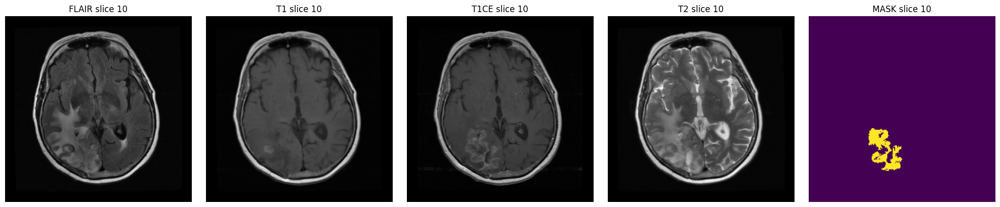

In [20]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-018"
show_btp_case(preproc_root, case_id,
              date_folder="1993-02-18")

show_btp_case(preproc_root, case_id,
              date_folder="1993-04-15")

### PGBM-019

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


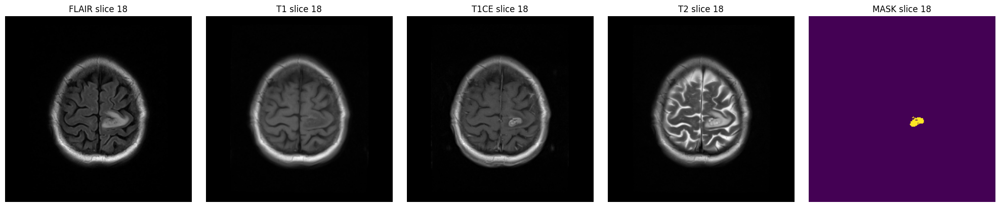

flair shape: (22, 240, 240)
t1 shape: (22, 240, 240)
t1ce shape: (22, 240, 240)
t2 shape: (22, 240, 240)
mask shape: (22, 240, 240)


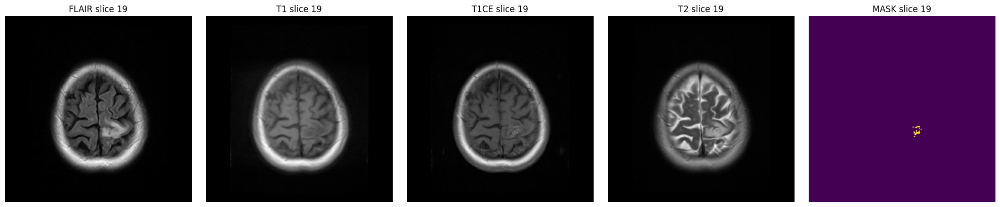

In [21]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-019"
show_btp_case(preproc_root, case_id,
              date_folder="1991-07-04")

show_btp_case(preproc_root, case_id,
              date_folder="1991-10-02")

### PGBM-020

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


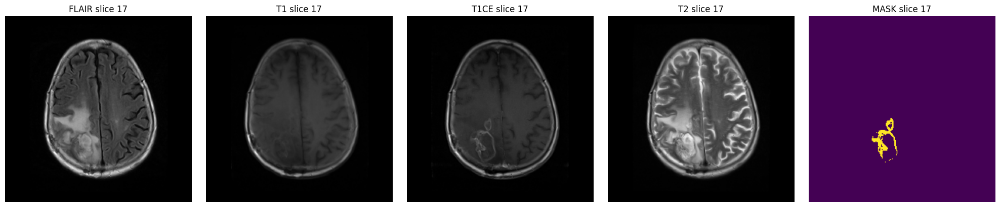

flair shape: (24, 240, 240)
t1 shape: (24, 240, 240)
t1ce shape: (24, 240, 240)
t2 shape: (24, 240, 240)
mask shape: (24, 240, 240)


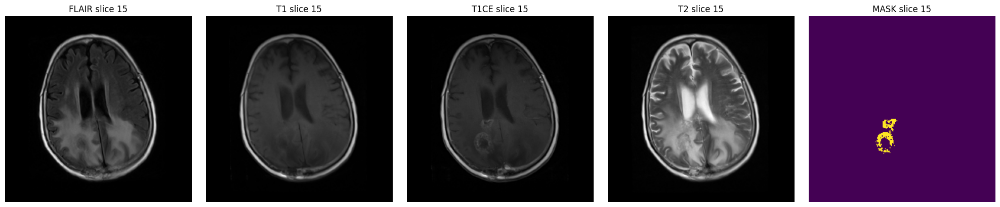

In [22]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

def show_btp_case(preproc_root, case_id, date_folder=None, mods=None):
    """
    preproc_root: 전처리된 BTP 루트 폴더
    case_id:      'PGBM-001' 같은 케이스 이름
    date_folder:  날짜별 서브폴더. None이면 첫 번째 자동 선택
    mods:         ['flair','t1','t1ce','t2','mask'] 등 표시할 모달리티
    """
    if mods is None:
        mods = ["flair","t1","t1ce","t2","mask"]

    case_dir = os.path.join(preproc_root, case_id)
    dates = sorted(d for d in os.listdir(case_dir)
                   if os.path.isdir(os.path.join(case_dir, d)))
    if not dates:
        raise RuntimeError(f"No date folders under {case_dir}")
    if date_folder is None:
        date_folder = dates[0]
    if date_folder not in dates:
        raise ValueError(f"{date_folder!r} not in {dates}")

    in_dir = os.path.join(case_dir, date_folder)
    fpaths = {m: os.path.join(in_dir, f"{m}.nii.gz") for m in mods}

    # 1) 각 모달리티 shape 출력
    for m, p in fpaths.items():
        arr = nib.load(p).get_fdata()
        print(f"{m} shape: {arr.shape}")  # now (Z, Y, X)

    # 2) 마스크가 있는 Z 인덱스 찾기
    mask = nib.load(fpaths["mask"]).get_fdata()  # (Z, Y, X)
    zs = np.where(mask.sum(axis=(1,2)) > 0)[0]
    if len(zs) > 0:
        z0 = zs[len(zs)//2]
    else:
        z0 = mask.shape[0] // 2

    # 3) 시각화
    fig, axs = plt.subplots(1, len(mods), figsize=(4*len(mods), 4))
    for ax, m in zip(axs, mods):
        vol = nib.load(fpaths[m]).get_fdata()     # (Z, Y, X)
        slice_img = vol[z0, :, :]                 # pick axial slice at Z = z0

        ax.imshow(
            slice_img,
            cmap="gray" if m != "mask" else "viridis",
            aspect="equal"
        )
        ax.set_title(f"{m.upper()} slice {z0}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()


# ─────────────────────────── 사용 예시 ───────────────────────────
preproc_root = "../data/btp_preproc_2d"
case_id      = "PGBM-020"
show_btp_case(preproc_root, case_id,
              date_folder="1989-11-09")

show_btp_case(preproc_root, case_id,
              date_folder="1990-03-08")